# Определение возраста покупателей

Задача проекта - предложить модель определения по фотографиям возраста покупателя, которая бы помогла решить следующие бизнес-задачи:  
    - предалгать определенные товары по возрастным группам  
    - контролировать добросоввестность кассиров при продаже алкоголя

## Исследовательский анализ данных

In [1]:
import pandas as pd
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
%matplotlib inline
import plotly.express as px
import numpy as np

In [2]:
#загрузим данные

labels = pd.read_csv('/datasets/faces/labels.csv')
train_datagen = ImageDataGenerator(rescale=1./255)
train_gen_flow = train_datagen.flow_from_dataframe(
        dataframe=labels,
        directory='/datasets/faces/final_files/',
        x_col='file_name',
        y_col='real_age',
        target_size=(224, 224),
        batch_size=32,
        class_mode='raw',
        seed=12345) 


Found 7591 validated image filenames.


In [3]:
labels.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7591 entries, 0 to 7590
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   file_name  7591 non-null   object
 1   real_age   7591 non-null   int64 
dtypes: int64(1), object(1)
memory usage: 118.7+ KB


In [4]:
labels.head()

,file_name,real_age
0,000000.jpg,4
1,000001.jpg,18
2,000002.jpg,80
3,000003.jpg,50
4,000004.jpg,17


In [5]:
#Посмотрим, как распределены фотографии по возрасту:
fig = px.histogram(labels, x="real_age")
fig.show()

In [6]:

fig = px.box(labels, y="real_age")
fig.show()

In [7]:
features, target = next(train_gen_flow)

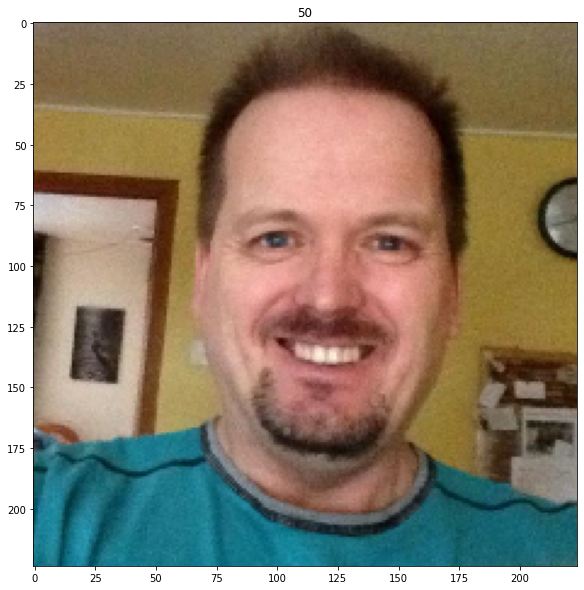

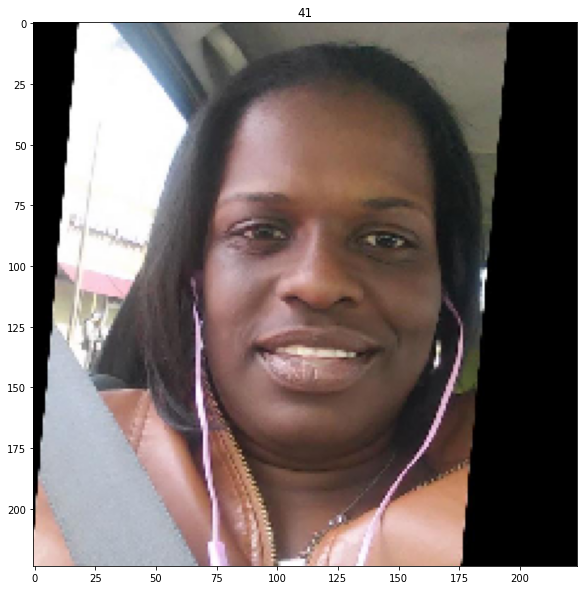

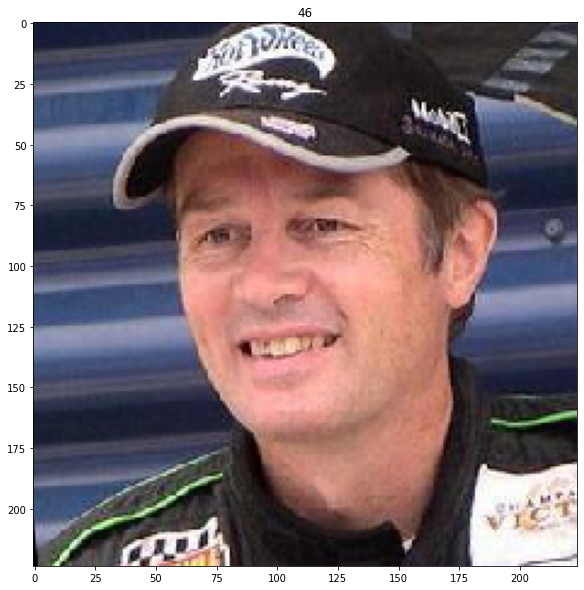

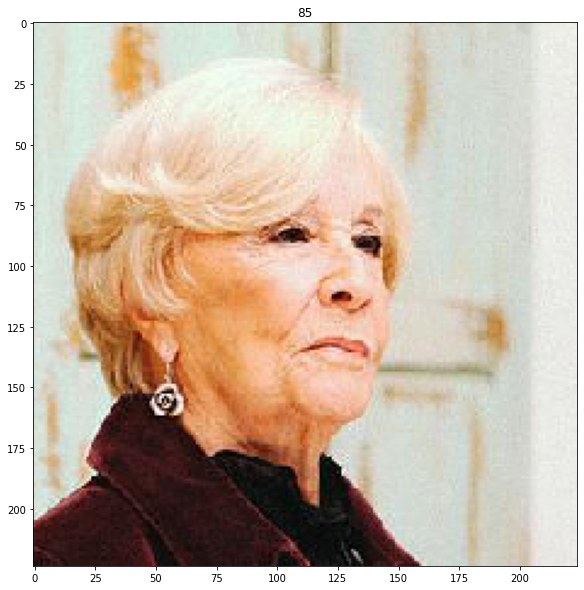

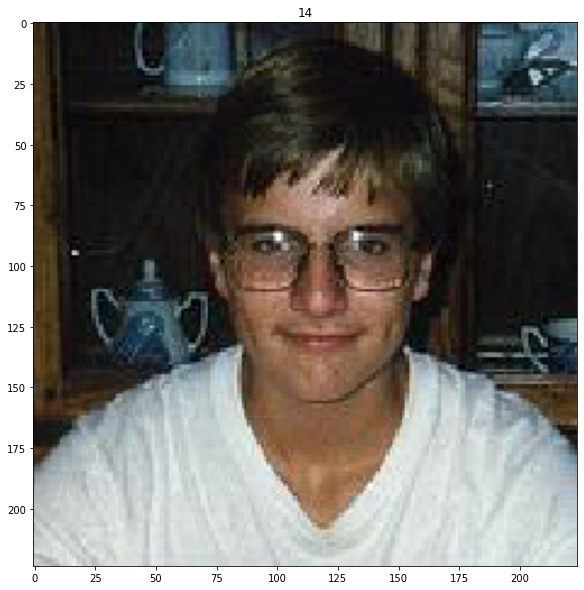

...

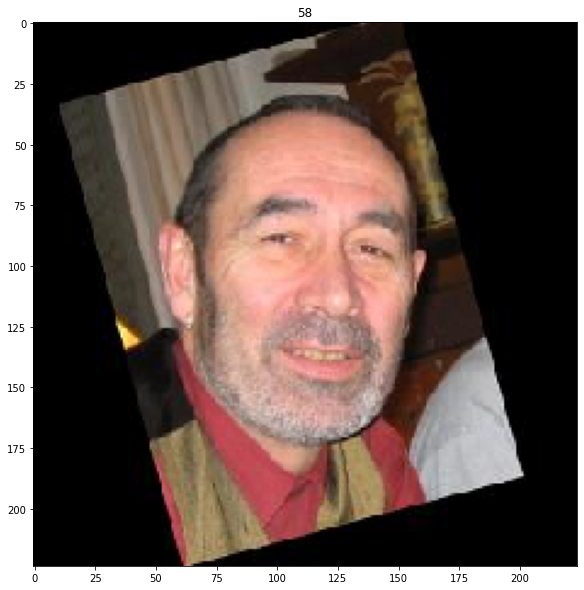

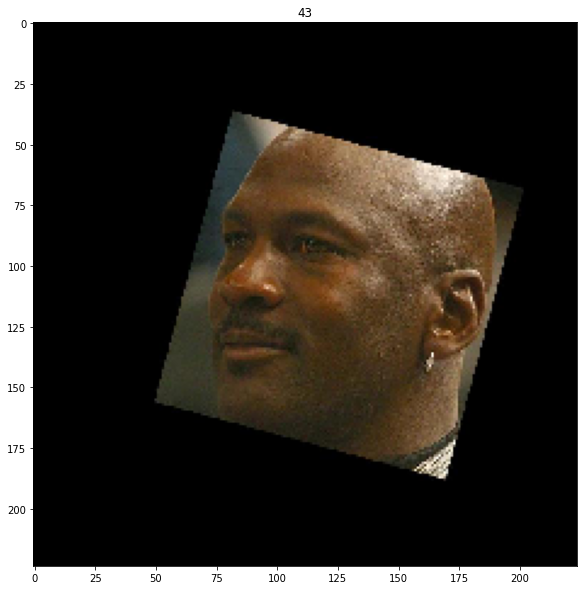

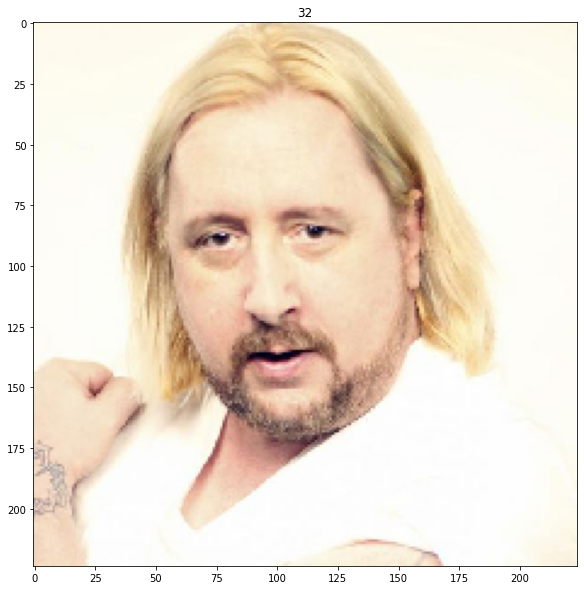

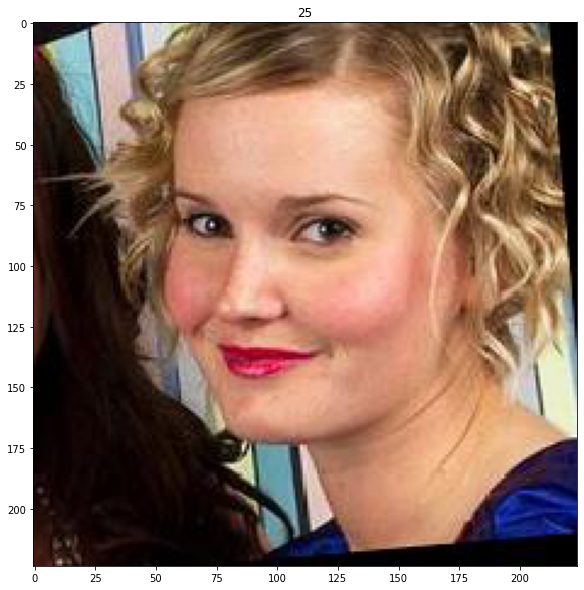

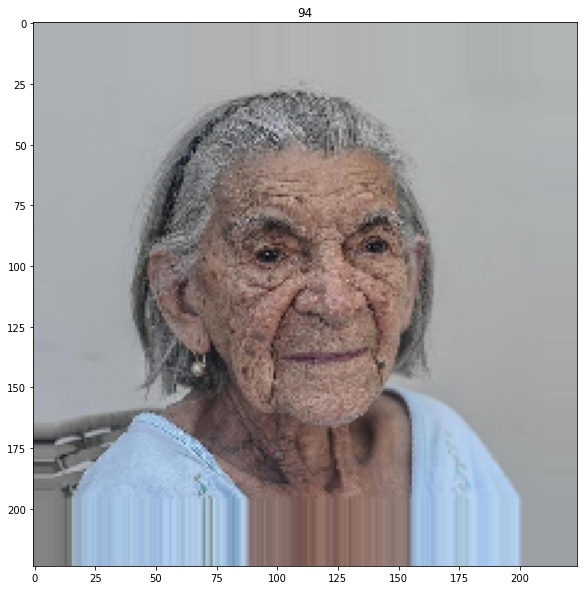

In [10]:
#Напечатаем 20 фотографий:
for age, photo in zip(target[:20], features[:20]):
    plt.figure(figsize=(10,10))
    plt.title(age)
    plt.imshow(photo)

### Видим фотографии, перевернутые относительно вертикальной оси, есть черно-белые, нужно в процессе обучения модели добавить аугументацию.

На гистограмме видим пики, приходящиеся на круглые значения возраста - скорее всего это связано с округлением, люди называют не точный, а примерный возраст. 
Выборка достаточно большая - 7.5 тыс фотогрфий, достаточная для обучения модели.

## Обучение модели

```python
from pickletools import optimize
from tensorflow.keras.applications.resnet import ResNet50
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import GlobalAveragePooling2D, Conv2D, AveragePooling2D, Flatten, Dense, Dropout
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
import numpy as np
import pandas as pd


def load_train(path):
    labels = pd.read_csv(path+'labels.csv')
    datagen = ImageDataGenerator(rescale=1/255, validation_split=0.25)
    train_datagen_flow = datagen.flow_from_dataframe(
        dataframe = labels,
        directory = path + 'final_files/',
        x_col='file_name',
        y_col='real_age',
        target_size=(224, 224),
        rotation_range=90,
        batch_size=32,
        class_mode='raw',
        subset = 'training',
        seed=132)
    return train_datagen_flow

def load_test(path):
    labels = pd.read_csv(path+'labels.csv')
    test_datagen = ImageDataGenerator(rescale= 1./255, validation_split=0.25)
    test_datagen_flow = test_datagen.flow_from_dataframe(
        dataframe = labels,
        directory = path + 'final_files/',
        x_col='file_name',
        y_col='real_age',
        target_size=(224, 224),
        batch_size=32,
        class_mode='raw',
        subset='validation',
        seed=132)
    return test_datagen_flow

def create_model(input_shape):
    optimizer = Adam(lr=0.0001)
    backbone = ResNet50(input_shape=(224, 224, 3), 
                        weights='imagenet',
                        include_top=False)
    model = Sequential()
    model.add(backbone)
    model.add(GlobalAveragePooling2D())
    model.add(Dense(units=1, activation='relu'))
    model.compile(loss='mse', optimizer='adam', metrics=['mae'])
    return model
def train_model(model, train_datagen_flow, test_datagen_flow, batch_size=None, epochs=10,
                steps_per_epoch=None, validation_steps=None):
    if steps_per_epoch is None:
        steps_per_epoch = len(train_datagen_flow)
    if validation_steps is None:
        validation_steps = len(test_datagen_flow)
    model.fit(train_datagen_flow,
              validation_data=test_datagen_flow,
              batch_size=batch_size, epochs=epochs,
              steps_per_epoch=steps_per_epoch,
              validation_steps=validation_steps,
              verbose=2)
    return model
```

```
Train for 178 steps, validate for 60 steps
Epoch 1/10
2022-09-29 05:21:59.844838: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcublas.so.10
2022-09-29 05:22:00.239371: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudnn.so.7
178/178 - 57s - loss: 254.5317 - mae: 12.0411 - val_loss: 9705.1201 - val_mae: 97.1642
Epoch 2/10
178/178 - 39s - loss: 162.3049 - mae: 9.7961 - val_loss: 310.1359 - val_mae: 13.0667
Epoch 3/10
178/178 - 39s - loss: 122.9444 - mae: 8.5135 - val_loss: 370.7498 - val_mae: 14.3581
Epoch 4/10
178/178 - 39s - loss: 98.1611 - mae: 7.5648 - val_loss: 261.6625 - val_mae: 12.0060
Epoch 5/10
178/178 - 39s - loss: 75.1141 - mae: 6.7056 - val_loss: 148.0276 - val_mae: 9.0346
Epoch 6/10
178/178 - 37s - loss: 52.3747 - mae: 5.6020 - val_loss: 134.7990 - val_mae: 8.9797
Epoch 7/10
178/178 - 37s - loss: 39.1665 - mae: 4.8334 - val_loss: 133.8117 - val_mae: 8.7492
Epoch 8/10
178/178 - 37s - loss: 27.6722 - mae: 4.0544 - val_loss: 94.5591 - val_mae: 7.4364
Epoch 9/10
178/178 - 37s - loss: 22.5872 - mae: 3.6578 - val_loss: 111.9375 - val_mae: 7.9368
Epoch 10/10
178/178 - 37s - loss: 18.6055 - mae: 3.3438 - val_loss: 93.8183 - val_mae: 7.4173
WARNING:tensorflow:sample_weight modes were coerced from
  ...
    to  
  ['...']
60/60 - 9s - loss: 93.8183 - mae: 7.4173
Test MAE: 7.4173
```

## Анализ обученной модели

Модель показала  высокие метрики качества, на тестовой выборке MAE - 7.4
Модель ResNet50 хорошо справилась с задачей предсказания возраста по фотографии.


Сначала модель обучалась с аугументацией, это привело к ухудшению ее качества, второй раз обучение проводилось без дополнительных изменений.

Модель позволяет с высокой точностью определятьв возраст покупателей - ее можно смело использовать для сегментирования рекламы, для контроля кассиров анализ фотографий можно использовать как дополнительный инструмент, в очевидных случаях нарушений система может сигнализировать об этом.  
